In [1]:
import pandas as pd
import geopandas as gpd
import movingpandas as mpd
from shapely.geometry import Point
from datetime import datetime, timedelta
import holoviews as hv
import hvplot.pandas 
import warnings
warnings.filterwarnings('ignore')


In [2]:
df = pd.read_pickle("data/interim/df_bike.pickle")
df

,id,class,frame_in,frame_out,xs_640x360,ys_640x360,num_frames,time_on_screen_s,x_start_640x360,x_end_640x360,y_start_640x360,y_end_640x360
0,2,Bicycle,250,409,"[483.545, 483.7, 483.85, 484.0, 484.15, 484.3,...","[181.87, 181.93, 181.985, 182.045, 182.1, 182....",160,5.333333,483.545,632.195,181.870,103.390
3,8,Bicycle,250,398,"[205.965, 205.775, 205.58, 205.39, 205.195, 20...","[230.0, 229.27, 228.53, 227.79, 227.045, 226.3...",149,4.966667,205.965,301.880,230.000,6.935
4,10,Bicycle,257,423,"[606.62, 602.955, 599.285, 595.615, 591.96, 58...","[145.22, 146.265, 147.325, 148.425, 149.57, 15...",167,5.566667,606.620,297.715,145.220,280.260
8,18,Bicycle,523,1482,"[194.58, 194.52, 194.455, 194.39, 194.325, 194...","[275.42, 275.18, 274.94, 274.7, 274.455, 274.2...",960,32.000000,194.580,609.115,275.420,121.685
9,20,Bicycle,674,1655,"[2.97, 3.425, 3.905, 4.395, 4.885, 5.375, 5.84...","[193.985, 193.64, 193.275, 192.905, 192.53, 19...",982,32.733333,2.970,625.260,193.985,112.135
...,...,...,...,...,...,...,...,...,...,...,...,...
18837,37676,Bicycle,1096773,1096989,"[625.37, 622.415, 619.44, 616.455, 613.465, 61...","[138.795, 140.055, 141.325, 142.605, 143.895, ...",217,7.233333,625.370,307.340,138.795,276.935
18838,37678,Bicycle,1096841,1096918,"[545.28, 543.88, 542.495, 541.115, 539.74, 538...","[187.275, 187.81, 188.34, 188.87, 189.39, 189....",78,2.600000,545.280,456.185,187.275,231.440
18839,37680,Bicycle,1096957,1097321,"[637.23, 636.435, 635.65, 634.87, 634.095, 633...","[137.145, 137.11, 137.085, 137.075, 137.095, 1...",365,12.166667,637.230,558.055,137.145,173.450
18840,37682,Bicycle,1097034,1097156,"[585.15, 585.15, 585.145, 585.145, 585.145, 58...","[171.855, 171.86, 171.86, 171.865, 171.865, 17...",123,4.100000,585.150,632.250,171.855,114.300


In [3]:
df['coordinates'] = df.apply(lambda row: list(zip(row['xs_640x360'], row['ys_640x360'])), axis=1)
df.drop(columns=['xs_640x360', 'ys_640x360'], inplace=True)
df

,id,class,frame_in,frame_out,num_frames,time_on_screen_s,x_start_640x360,x_end_640x360,y_start_640x360,y_end_640x360,coordinates
0,2,Bicycle,250,409,160,5.333333,483.545,632.195,181.870,103.390,"[(483.545, 181.87), (483.7, 181.93), (483.85, ..."
3,8,Bicycle,250,398,149,4.966667,205.965,301.880,230.000,6.935,"[(205.965, 230.0), (205.775, 229.27), (205.58,..."
4,10,Bicycle,257,423,167,5.566667,606.620,297.715,145.220,280.260,"[(606.62, 145.22), (602.955, 146.265), (599.28..."
8,18,Bicycle,523,1482,960,32.000000,194.580,609.115,275.420,121.685,"[(194.58, 275.42), (194.52, 275.18), (194.455,..."
9,20,Bicycle,674,1655,982,32.733333,2.970,625.260,193.985,112.135,"[(2.97, 193.985), (3.425, 193.64), (3.905, 193..."
...,...,...,...,...,...,...,...,...,...,...,...
18837,37676,Bicycle,1096773,1096989,217,7.233333,625.370,307.340,138.795,276.935,"[(625.37, 138.795), (622.415, 140.055), (619.4..."
18838,37678,Bicycle,1096841,1096918,78,2.600000,545.280,456.185,187.275,231.440,"[(545.28, 187.275), (543.88, 187.81), (542.495..."
18839,37680,Bicycle,1096957,1097321,365,12.166667,637.230,558.055,137.145,173.450,"[(637.23, 137.145), (636.435, 137.11), (635.65..."
18840,37682,Bicycle,1097034,1097156,123,4.100000,585.150,632.250,171.855,114.300,"[(585.15, 171.855), (585.15, 171.86), (585.145..."


In [4]:
df.frame_out.max()/60/1000

18.288683333333335

In [5]:
def unixtime_to_datetime(unix_time):
    return datetime.fromtimestamp(unix_time)
 
def compute_datetime(row):
    # some educated guessing going on here: the paper states that the video covers 2021-06-09 07:00-08:00
    d = datetime(2021,6,9,7,0,0) + (row['frame_in'] + row['running_number']) * timedelta(seconds=2)
    return d

def create_point(xy):
    try: 
        return Point(xy)
    except TypeError:  # when there are nan values in the input data
        return None


new_df = df.head().explode('coordinates')
new_df['geometry'] = new_df['coordinates'].apply(create_point)
new_df['running_number'] = new_df.groupby('id').cumcount()
new_df['datetime'] = new_df.apply(compute_datetime, axis=1)
new_df.drop(columns=['coordinates', 'frame_in', 'running_number'], inplace=True)
new_df

,id,class,frame_out,num_frames,time_on_screen_s,x_start_640x360,x_end_640x360,y_start_640x360,y_end_640x360,geometry,datetime
0,2,Bicycle,409,160,5.333333,483.545,632.195,181.870,103.390,POINT (483.545 181.87),2021-06-09 07:08:20
0,2,Bicycle,409,160,5.333333,483.545,632.195,181.870,103.390,POINT (483.7 181.93),2021-06-09 07:08:22
0,2,Bicycle,409,160,5.333333,483.545,632.195,181.870,103.390,POINT (483.85 181.985),2021-06-09 07:08:24
0,2,Bicycle,409,160,5.333333,483.545,632.195,181.870,103.390,POINT (484 182.045),2021-06-09 07:08:26
0,2,Bicycle,409,160,5.333333,483.545,632.195,181.870,103.390,POINT (484.15 182.1),2021-06-09 07:08:28
...,...,...,...,...,...,...,...,...,...,...,...
9,20,Bicycle,1655,982,32.733333,2.970,625.260,193.985,112.135,POINT (624.995 112.36500000000001),2021-06-09 07:55:02
9,20,Bicycle,1655,982,32.733333,2.970,625.260,193.985,112.135,POINT (625.155 112.24000000000001),2021-06-09 07:55:04
9,20,Bicycle,1655,982,32.733333,2.970,625.260,193.985,112.135,POINT (625.235 112.16499999999999),2021-06-09 07:55:06
9,20,Bicycle,1655,982,32.733333,2.970,625.260,193.985,112.135,POINT (625.26 112.13499999999999),2021-06-09 07:55:08


In [6]:
new_df.datetime.max()

Timestamp('2021-06-09 07:55:10')

In [7]:
trajs = mpd.TrajectoryCollection(
    gpd.GeoDataFrame(new_df), 
    traj_id_col='id',  t='datetime', crs=None)
trajs

TrajectoryCollection with 5 trajectories

In [8]:
trajs = mpd.MinTimeDeltaGeneralizer(trajs).generalize(tolerance=timedelta(seconds=10))
trajs.add_speed(overwrite=True)
traj = trajs.trajectories[2]
traj

Trajectory 10 (2021-06-09 07:08:34 to 2021-06-09 07:14:06) | Size: 35 | Length: 338.2m
Bounds: (297.715, 145.22, 606.62, 280.26)
LINESTRING (606.62 145.22, 588.325 150.775, 570.99 158.285, 555.595 168.525, 540.77 178.485, 525.255

In [9]:
hvplot_defaults = {'line_width':5, 'frame_height':360, 'frame_width':640, 'colorbar':True, 'tiles':None, 'geo':False,}

traj.hvplot( **hvplot_defaults)

:Overlay
   .Path.I   :Path   [x,y]
   .Points.I :Points   [x,y]   (triangle_angle)

In [10]:
bg_img = hv.RGB.load_image('img/intersection2.png', bounds=(0,0,640,360)) 
bg_img * traj.hvplot( **hvplot_defaults, c='speed', cmap='Reds')

:Overlay
   .RGB.I    :RGB   [x,y]   (R,G,B,A)
   .Path.I   :Path   [x,y]   (speed)
   .Points.I :Points   [x,y]   (speed,triangle_angle)

In [11]:
bg_img * trajs.hvplot( **hvplot_defaults, hover_cols=['id'])

:Overlay
   .RGB.I      :RGB   [x,y]   (R,G,B,A)
   .Path.I     :Path   [x,y]   (id)
   .Points.I   :Points   [x,y]   (triangle_angle,id)
   .Path.II    :Path   [x,y]   (id)
   .Points.II  :Points   [x,y]   (triangle_angle,triangle_angle,id)
   .Path.III   :Path   [x,y]   (id)
   .Points.III :Points   [x,y]   (triangle_angle,triangle_angle,triangle_angle,id)
   .Path.IV    :Path   [x,y]   (id)
   .Points.IV  :Points   [x,y]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,id)
   .Path.V     :Path   [x,y]   (id)
   .Points.V   :Points   [x,y]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,id)

In [12]:
bg_img * trajs.hvplot( **hvplot_defaults, c='speed', cmap='Reds', hover_cols=['id'])

:Overlay
   .RGB.I      :RGB   [x,y]   (R,G,B,A)
   .Path.I     :Path   [x,y]   (speed,id)
   .Points.I   :Points   [x,y]   (speed,triangle_angle,id)
   .Path.II    :Path   [x,y]   (speed,id)
   .Points.II  :Points   [x,y]   (speed,triangle_angle,triangle_angle,id)
   .Path.III   :Path   [x,y]   (speed,id)
   .Points.III :Points   [x,y]   (speed,triangle_angle,triangle_angle,triangle_angle,id)
   .Path.IV    :Path   [x,y]   (speed,id)
   .Points.IV  :Points   [x,y]   (speed,triangle_angle,triangle_angle,triangle_angle,triangle_angle,id)
   .Path.V     :Path   [x,y]   (speed,id)
   .Points.V   :Points   [x,y]   (speed,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,id)

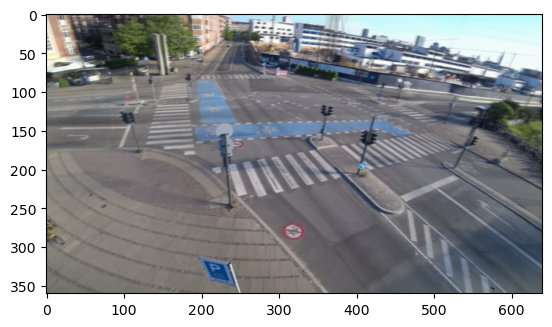

In [13]:
import matplotlib.pyplot as plt
img_path = 'img/intersection2.png'
filtered_bg_img = plt.imread(img_path)
ax = plt.imshow(filtered_bg_img)

<Axes: >

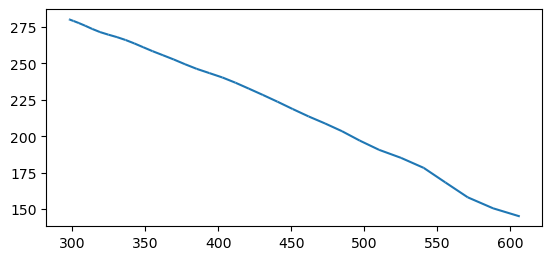

In [14]:
traj.plot()

In [15]:
traj.plot(ax=ax)

AttributeError: 'AxesImage' object has no attribute 'set_aspect'